<a href="https://colab.research.google.com/github/upstream001/yolov8/blob/main/yolov8CustomObjectDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!nvidia-smi

Sun Sep  8 04:19:29 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.8/871.8 kB 11.7 MB/s eta 0:00:00


In [4]:
from ultralytics import YOLO
import os
from IPython.display import display,Image
from IPython import display
display.clear_output()
!yolo checks

Ultralytics YOLOv8.2.90 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.8/112.6 GB disk)

OS                  Linux-6.1.85+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 12.67 GB
CPU                 Intel Xeon 2.20GHz
CUDA                12.1

numpy               ✅ 1.26.4<2.0.0,>=1.23.0
matplotlib          ✅ 3.7.1>=3.3.0
opencv-python       ✅ 4.10.0.84>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.2>=5.3.1
requests            ✅ 2.32.3>=2.23.0
scipy               ✅ 1.13.1>=1.4.1
torch               ✅ 2.4.0+cu121>=1.8.0
torchvision         ✅ 0.19.0+cu121>=0.9.0
tqdm                ✅ 4.66.5>=4.64.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
pandas              ✅ 2.1.4>=1.1.4
seaborn             ✅ 0.13.1>=0.11.0
ultralytics-thop    ✅ 2.0.6>=2.0.0
torch               ✅ 2.4.0+cu121!=2.4.0,>=1.8.0; sys_platform == "win32"


In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="YxhQNDUmSzkASz1Fxtse")
project = rf.workspace("roboflow-jvuqo").project("football-players-detection-3zvbc")
version = project.version(12)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.2 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.8
    Uninstalling idna-3.8:
      Successfully uninstalled idna-3.8
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.90, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to football-players-detection-12 in yolov8:: 100%|██████████| 756/756 [00:00<00:00, 2694.78it/s]


In [8]:
!yolo task=detect mode=train model=yolov8m.pt data='/content/football-players-detection-12/data.yaml' epochs=20 imgsz=1280 batch=4

Ultralytics YOLOv8.2.90 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/football-players-detection-12/data.yaml, epochs=20, time=None, patience=100, batch=4, imgsz=1280, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True

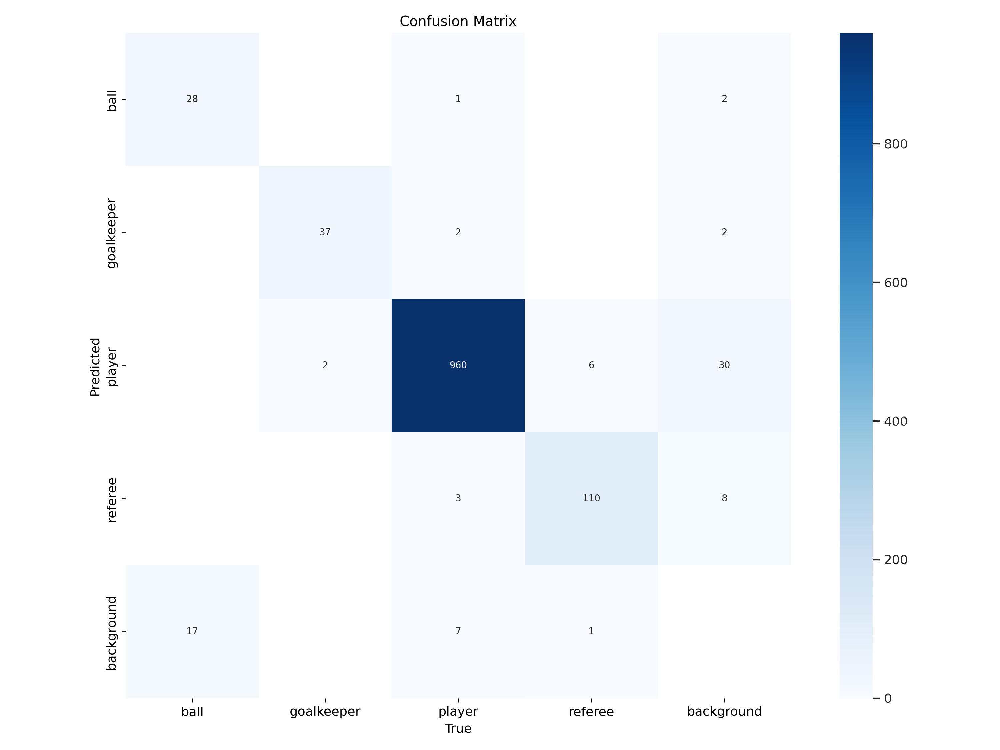

In [11]:
Image(filename=f'/content/runs/detect/train3/confusion_matrix.png',width=600)

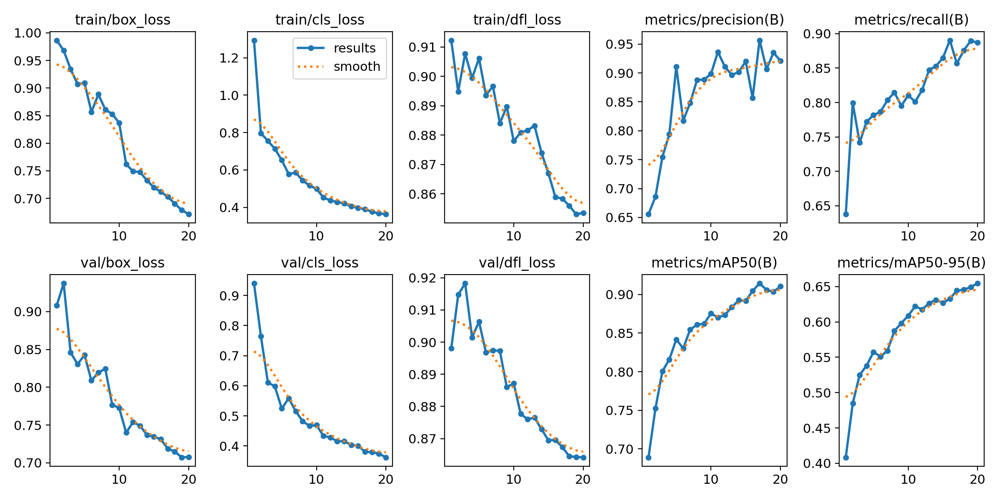

In [12]:
Image(filename='/content/runs/detect/train3/results.png',width=600)

In [14]:
!yolo task=detect mode=val model='/content/runs/detect/train3/weights/best.pt' data='/content/football-players-detection-12/data.yaml'

Ultralytics YOLOv8.2.90 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/football-players-detection-12/valid/labels.cache... 49 images, 0 backgrounds, 0 corrupt: 100% 49/49 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 4/4 [00:16<00:00,  4.00s/it]
                   all         49       1174       0.92      0.887      0.909      0.674
                  ball         45         45        0.9      0.644      0.688      0.354
            goalkeeper         38         39      0.886      0.949      0.973      0.782
                player         49        973      0.963       0.99      0.994       0.85
               referee         49        117      0.931      0.966      0.981       0.71
Speed: 48.5ms preprocess, 85.1ms inference, 0.0ms loss, 49.6ms postprocess per image
Results saved to runs/detect/val2
💡 

In [16]:
!yolo task=detect mode=predict model='/content/runs/detect/train3/weights/best.pt' conf=0.5 source='/content/football-players-detection-12/test/images'

Ultralytics YOLOv8.2.90 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs

image 1/25 /content/football-players-detection-12/test/images/08fd33_3_6_png.rf.bee65249830b3e263ebe95a999f39e34.jpg: 1280x1280 20 players, 2 referees, 111.6ms
image 2/25 /content/football-players-detection-12/test/images/08fd33_9_3_png.rf.f5439a0d252bbf8a8ce96169744b49b6.jpg: 1280x1280 1 goalkeeper, 20 players, 1 referee, 73.6ms
image 3/25 /content/football-players-detection-12/test/images/40cd38_7_6_png.rf.dc7957fcce915bc48188f18a7b19455b.jpg: 1280x1280 1 ball, 1 goalkeeper, 20 players, 1 referee, 71.7ms
image 4/25 /content/football-players-detection-12/test/images/42ba34_1_5_png.rf.927d602c034ce2997f58f62a7c1245ba.jpg: 1280x1280 1 ball, 1 goalkeeper, 20 players, 2 referees, 71.7ms
image 5/25 /content/football-players-detection-12/test/images/42ba34_5_5_png.rf.f691b18c36a92663c7241c99d4202bcc.jpg: 1280x1280 1 goalke

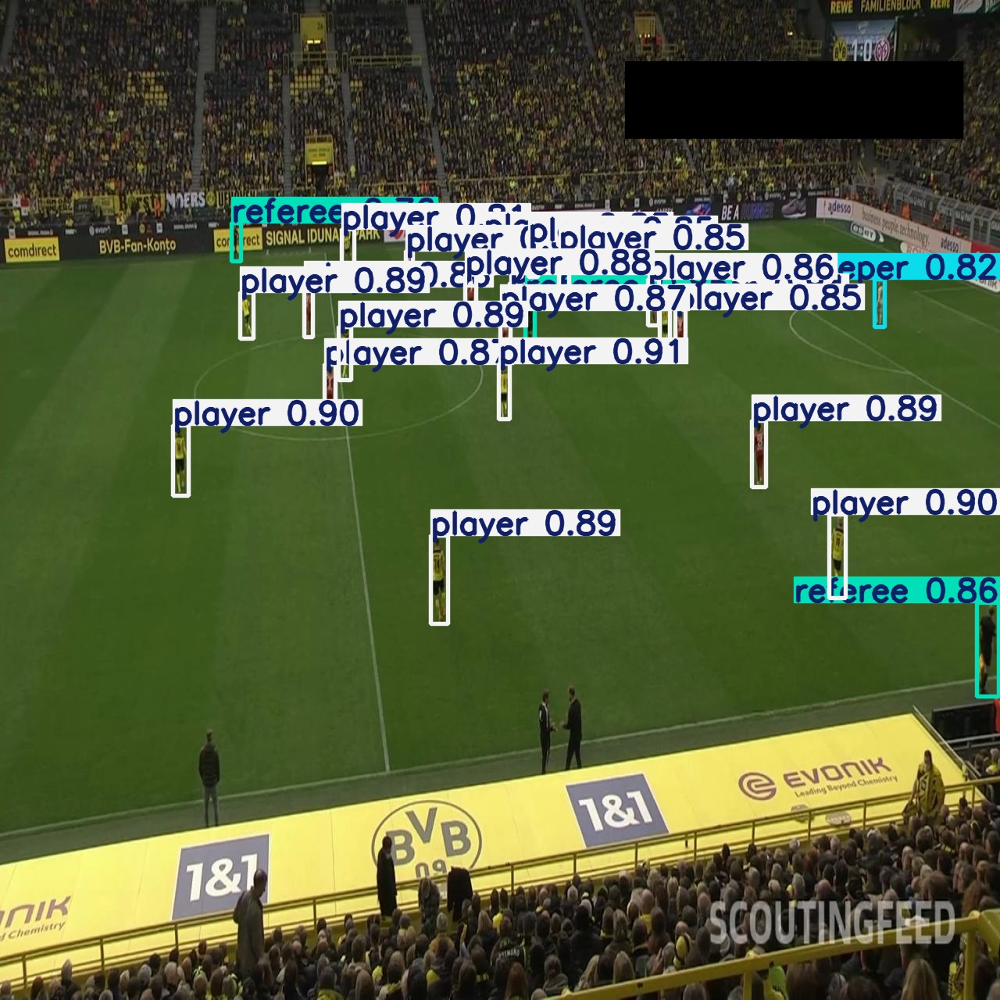

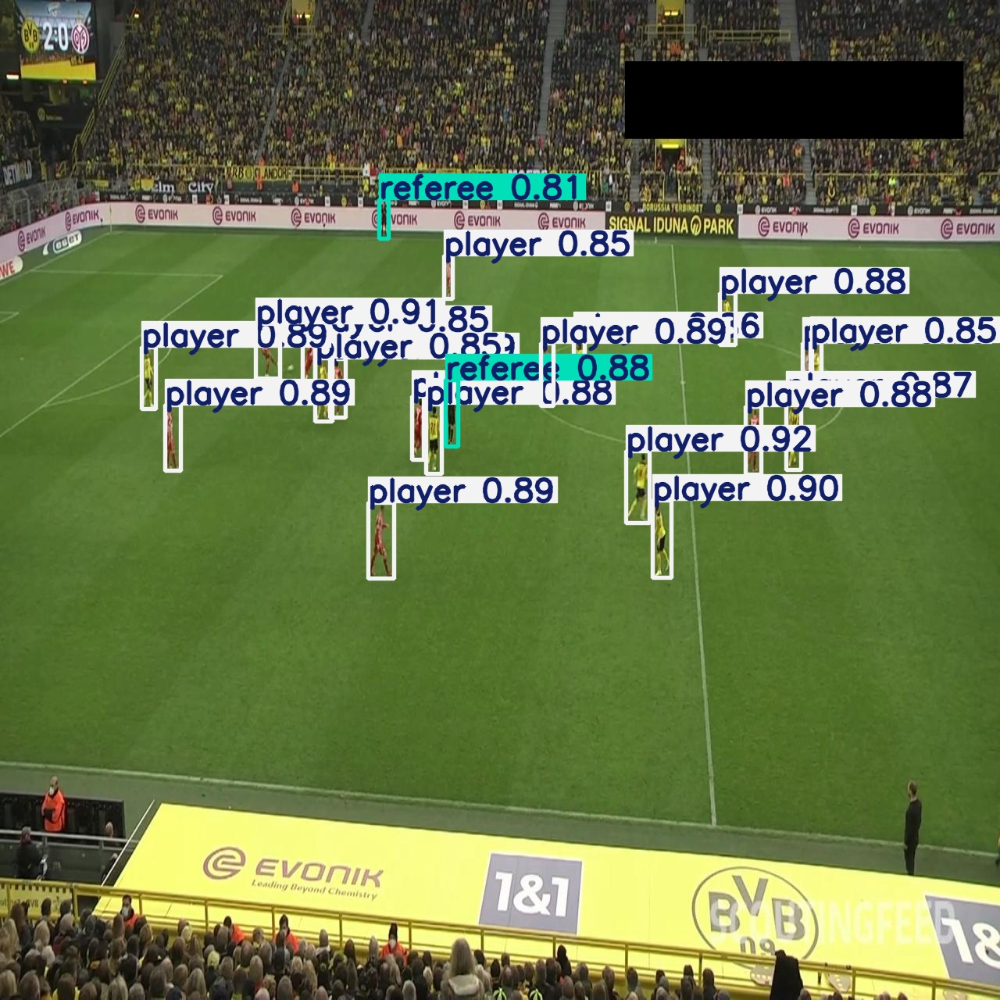

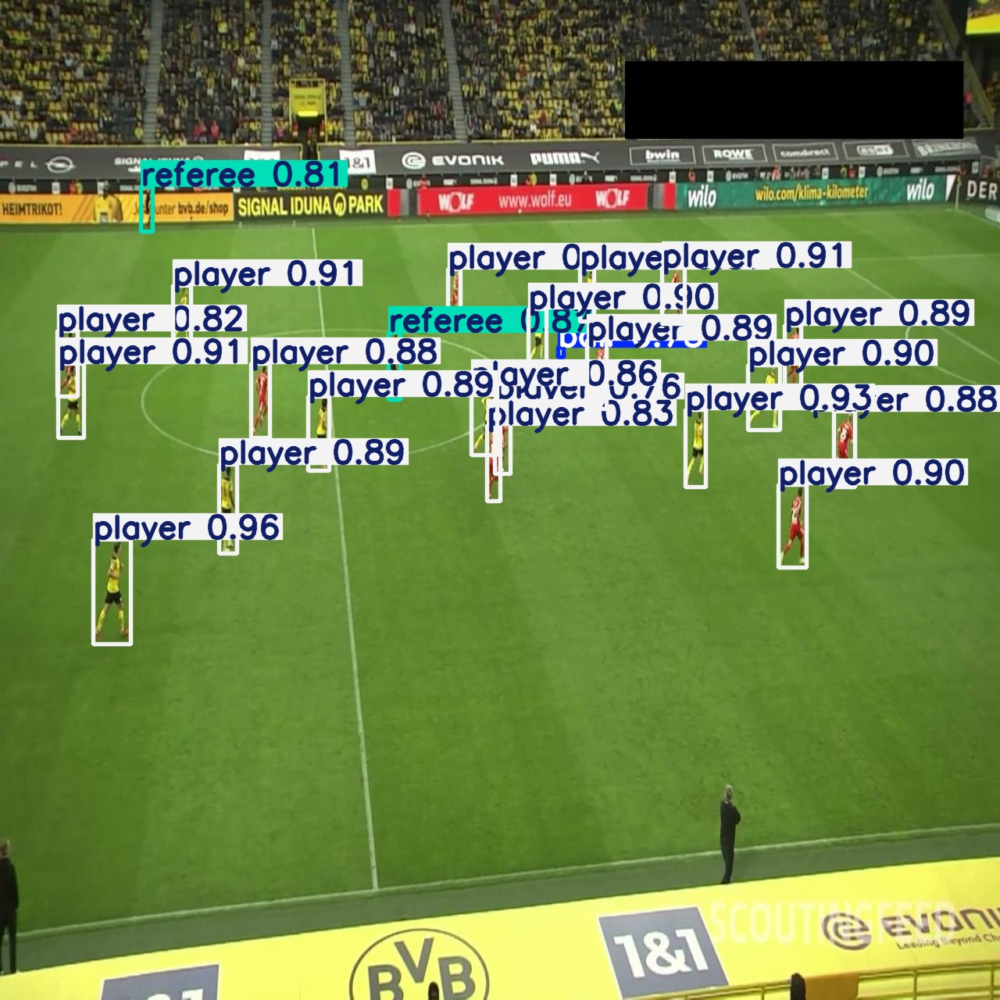

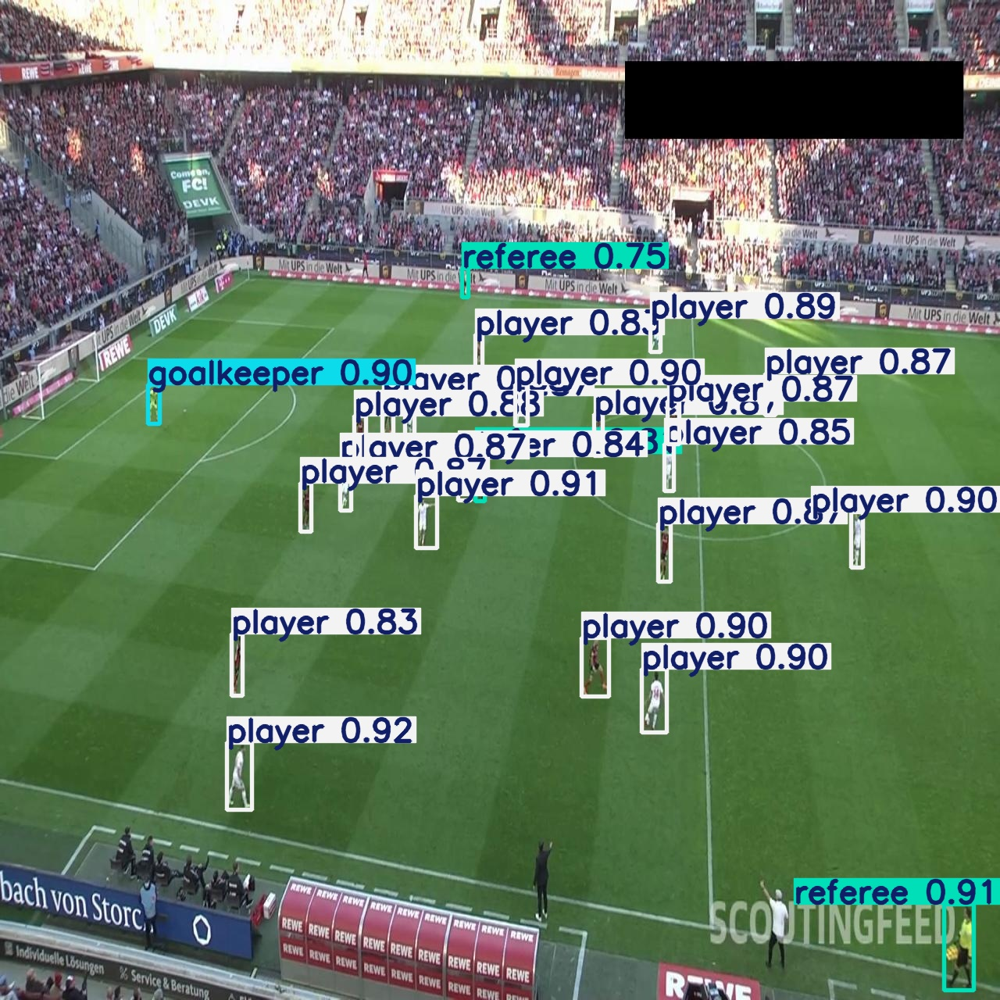

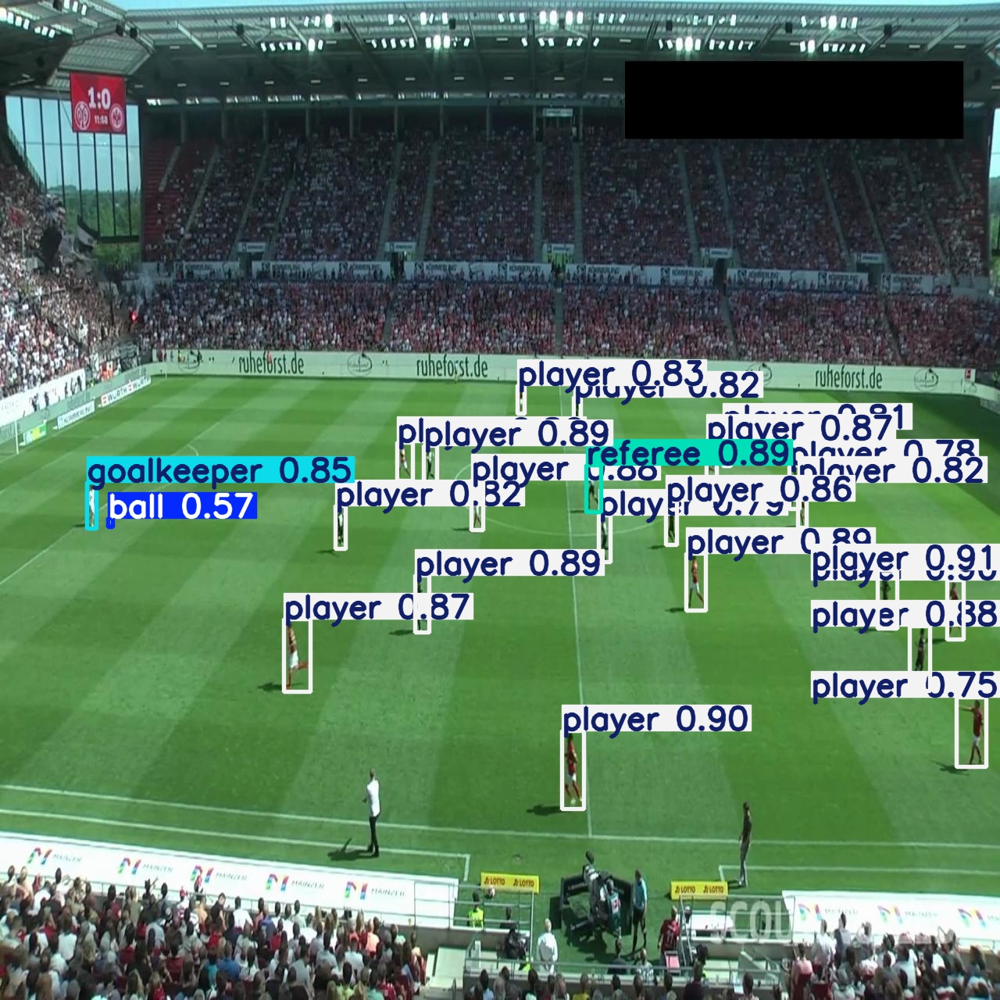

...

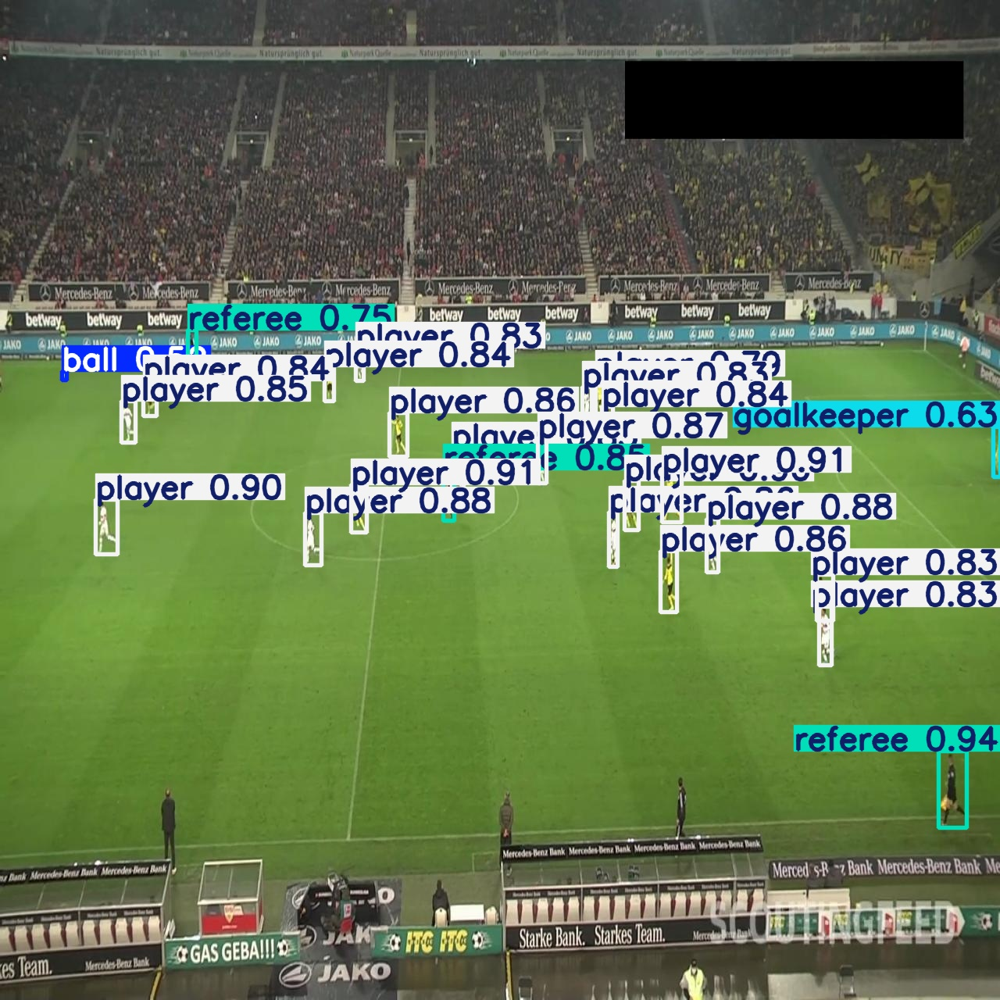

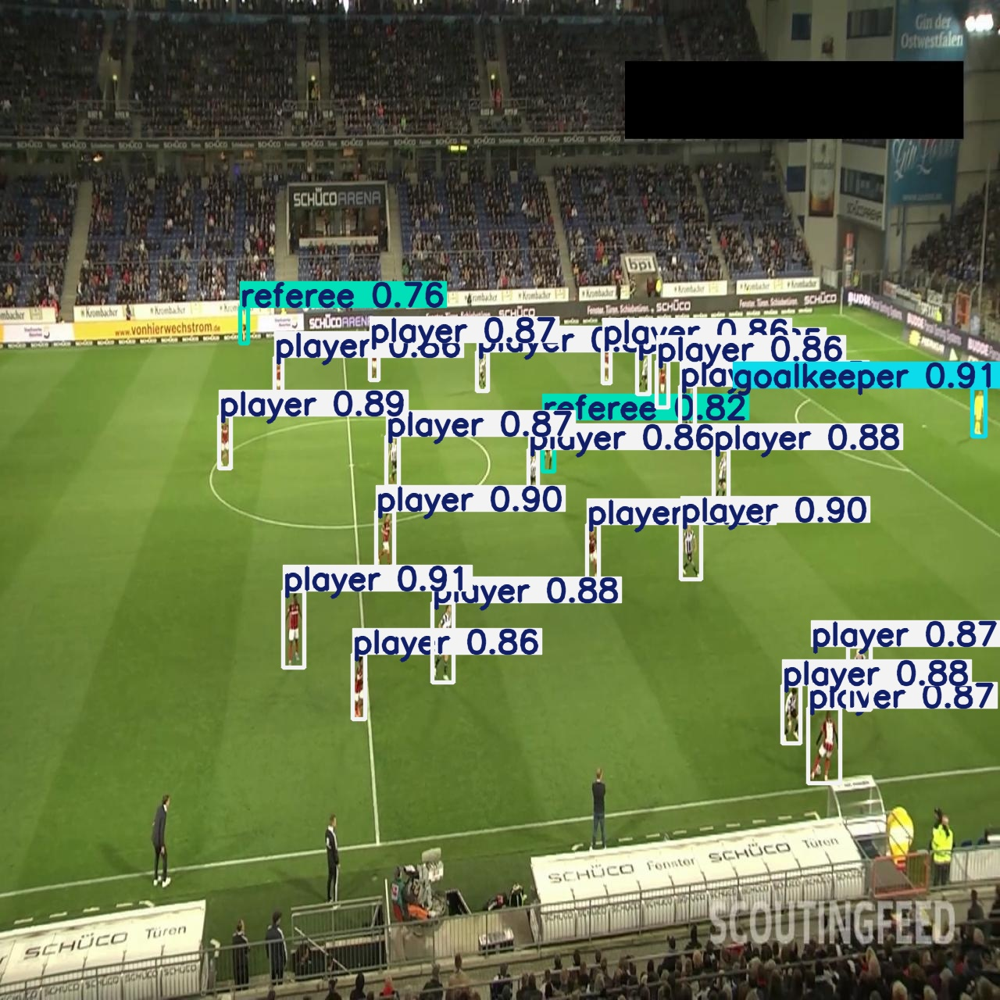

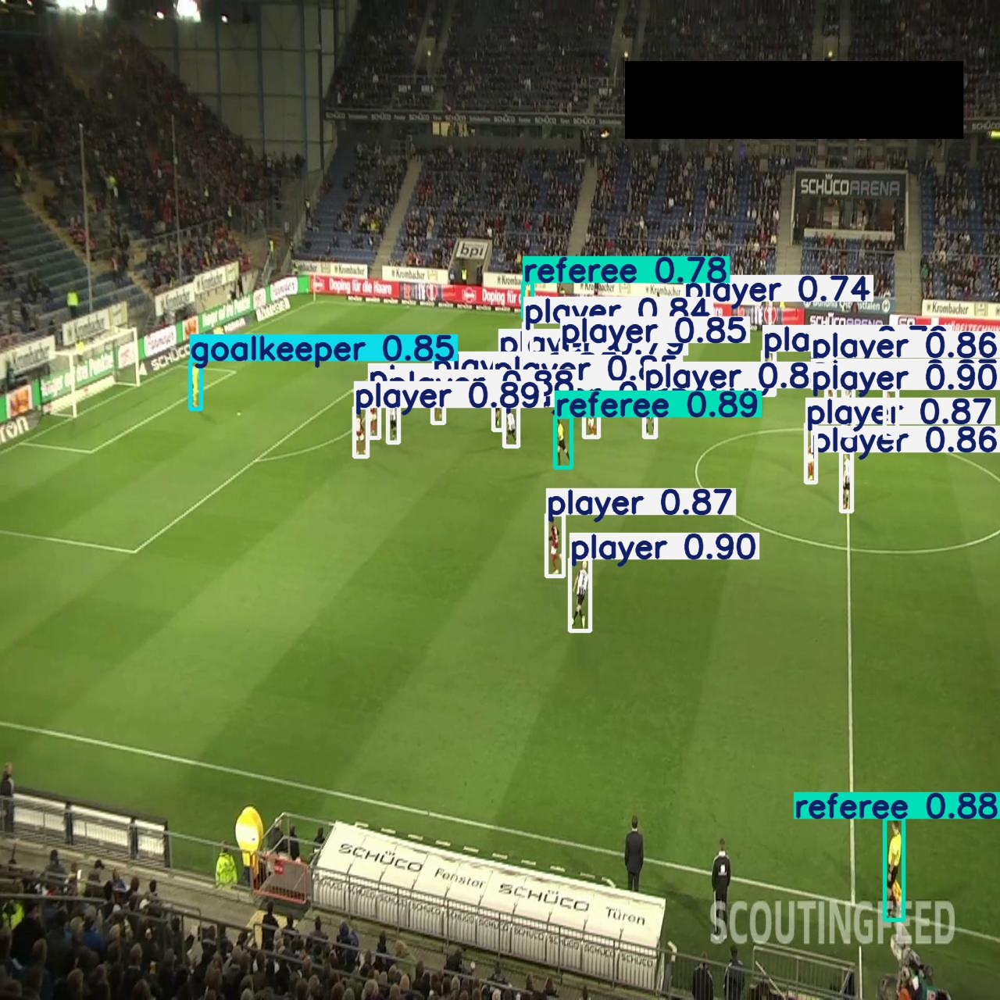

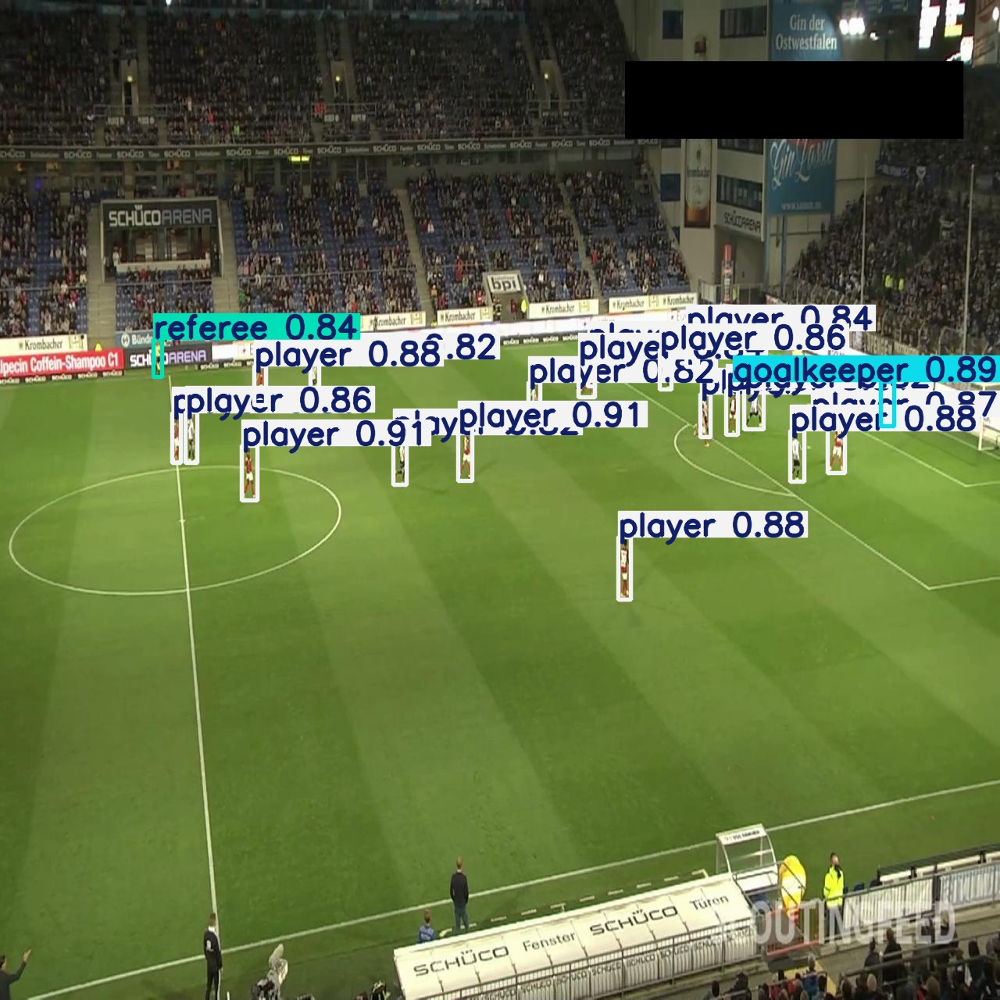

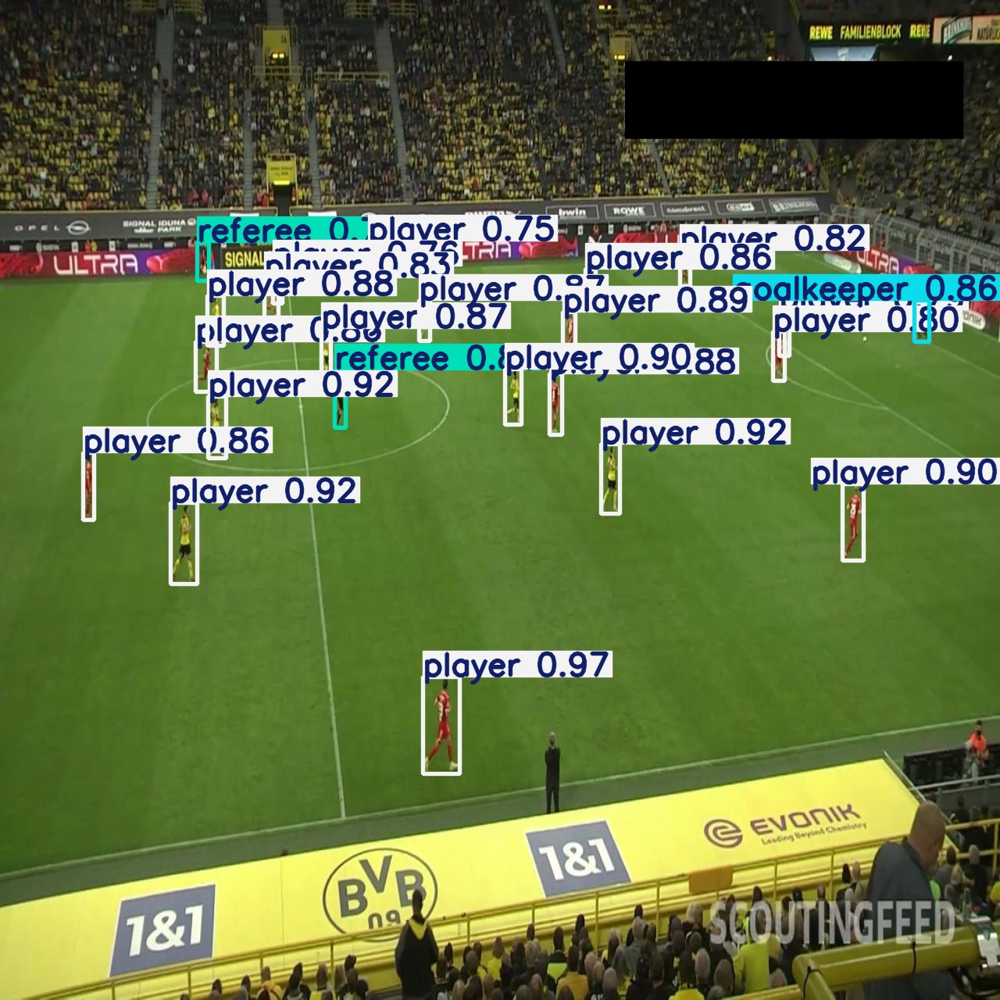

In [18]:
import glob
from IPython.display import display,Image
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display(Image(filename=image_path,width=600))
  print('\n')